In [291]:
pip install klib


In [292]:
pip install plotly-express

In [1]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import klib
import plotly_express as px
from ipywidgets import interact,interact_manual
import ipywidgets as widgets
from scipy import stats

<h2>load the data</h2>

In [294]:
all_data=pd.read_csv('/content/drive/MyDrive/workshop/cleaned_data.csv')

In [295]:
all_data.head()

,Unnamed: 0,unnamed:_0.1,student_id,student_name,school,administration,division,student_status,arabic,english,...,physics,total_score,religious_education,citizenship_education,economics_and_statistics,percentage,governorate,lat,lot,gender
0,0,0,1002330,ابراهيم سعيد محمد فرج,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,48.0,25.0,...,0.0,224.0,20.0,13.0,26.0,54.63,Giza,29.987075,31.211806,Male
1,1,1,1002331,احمد حسام السيد حارون,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,56.0,41.0,...,0.0,284.0,18.0,18.0,32.0,69.27,Giza,29.987075,31.211806,Male
2,2,2,1002332,احمد صلاح حسن احمد جعفر,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,53.0,25.0,...,0.0,236.0,20.0,18.0,28.0,57.56,Giza,29.987075,31.211806,Male
3,3,3,1002333,توفيق محمد توفيق مهران قاسم,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,79.0,37.0,...,0.0,359.0,17.0,20.0,29.0,87.56,Giza,29.987075,31.211806,Male
4,4,4,1002334,زياد حسن محمد احمد,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,65.0,36.0,...,0.0,286.0,16.0,19.0,27.0,69.76,Giza,29.987075,31.211806,Male


<h2 style="color: yellow" >General Analysis for Literary Specialization</h2>

In [296]:
df_literary=all_data[all_data['division']=='literary']

In [297]:
df_literary.head()

,Unnamed: 0,unnamed:_0.1,student_id,student_name,school,administration,division,student_status,arabic,english,...,physics,total_score,religious_education,citizenship_education,economics_and_statistics,percentage,governorate,lat,lot,gender
0,0,0,1002330,ابراهيم سعيد محمد فرج,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,48.0,25.0,...,0.0,224.0,20.0,13.0,26.0,54.63,Giza,29.987075,31.211806,Male
1,1,1,1002331,احمد حسام السيد حارون,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,56.0,41.0,...,0.0,284.0,18.0,18.0,32.0,69.27,Giza,29.987075,31.211806,Male
2,2,2,1002332,احمد صلاح حسن احمد جعفر,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,53.0,25.0,...,0.0,236.0,20.0,18.0,28.0,57.56,Giza,29.987075,31.211806,Male
3,3,3,1002333,توفيق محمد توفيق مهران قاسم,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,79.0,37.0,...,0.0,359.0,17.0,20.0,29.0,87.56,Giza,29.987075,31.211806,Male
4,4,4,1002334,زياد حسن محمد احمد,النور ث للمكفوفين بالجيزة بنين,الدقى,literary,successful,65.0,36.0,...,0.0,286.0,16.0,19.0,27.0,69.76,Giza,29.987075,31.211806,Male


In [298]:
#info about the data
df_literary.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33060 entries, 0 to 83126
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                33060 non-null  int64  
 1   unnamed:_0.1              33060 non-null  int64  
 2   student_id                33060 non-null  int64  
 3   student_name              33060 non-null  object 
 4   school                    33060 non-null  object 
 5   administration            33060 non-null  object 
 6   division                  33060 non-null  object 
 7   student_status            33060 non-null  object 
 8   arabic                    33060 non-null  float64
 9   english                   33060 non-null  float64
 10  french                    33060 non-null  float64
 11  pure_mathematics          33060 non-null  float64
 12  history                   33060 non-null  float64
 13  geography                 33060 non-null  float64
 14  philos

In [299]:
#drop the Unnamed: 0,unnamed:_0.1
df_literary.drop(['Unnamed: 0','unnamed:_0.1','pure_mathematics','chemistry','biology','geology','appliedmathematics','physics'],axis=1,inplace=True)

<ipython-input-299-b57b2ea9f3f7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [300]:
# describe of numerical values
df_literary.describe().style.background_gradient()

,student_id,arabic,english,french,history,geography,philosophy,psychology_and_sociology,total_score,religious_education,citizenship_education,economics_and_statistics,percentage,lat,lot
count,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000
mean,1089648.842982,48.382668,29.180097,26.122247,35.568088,40.911963,38.897247,39.030792,258.093103,17.038979,17.305175,25.847801,62.949558,29.839279,31.031627
std,111408.145676,10.306960,7.736865,7.482670,8.313002,10.286589,8.923108,8.153158,49.468147,2.951337,3.345132,3.828352,12.065399,0.593478,0.409969
min,1002330.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22.002892,29.895172
25%,1028783.750000,40.000000,25.000000,20.000000,30.000000,31.000000,32.000000,33.000000,225.000000,15.000000,15.000000,25.000000,54.880000,29.340737,30.854477
50%,1056058.500000,47.500000,25.000000,25.000000,33.500000,42.000000,39.000000,39.500000,257.500000,17.000000,17.320000,25.000000,62.800000,29.987075,31.211806
75%,1088690.250000,55.500000,34.000000,32.000000,41.000000,49.500000,45.500000,45.000000,292.000000,19.000000,20.000000,26.000000,71.220000,29.987075,31.211806
max,1454889.000000,79.000000,49.500000,40.000000,60.000000,60.000000,60.000000,60.000000,398.000000,25.000000,25.000000,49.000000,97.070000,31.416743,36.673075


> - About 75% of the Students in this Specialization have higher than 50% Percentage Grade
> - And Only About 25% of the Students in this Specialization have higher than 71% Percentage Grade
> - Most Student Grades in this Specialization are above Success Grade
> - Highest Total Grade in this Specialization is 398



In [301]:
df_literary.describe(include='object').style.background_gradient()

,student_name,school,administration,division,student_status,governorate,gender
count,33060,33060,33060,33060,33060,33060,33060
unique,32008,918,73,1,4,20,2
top,محمد ابراهيم محمد ابراهيم,حمزة بن عبد المطلب ث بنات,الهرم,literary,successful,Giza,Female
freq,8,567,3090,33060,30577,20443,17058


> - Most School that has Literary Specialization Students is `حمزة بن عبد المطلب ث بنات	`
> -  Most governorate that has Literary Specialization Students is `Giza`
> -  Most governorate that has Literary administration Students is `الهرم`
> - Most Students in the Literary Specialization are `Females`

In [302]:
len(df_literary)/len(all_data)

0.3972173160797318

<h2 style='color: yellow'>In Subjects, Let's Start with Subjects that don't Participate in Total Grade in Literary Specialization
<h2>

In [303]:
Not_intotal_subject=df_literary[['religious_education','citizenship_education','economics_and_statistics']]

In [304]:
Not_intotal_subject.describe().style.background_gradient()

,religious_education,citizenship_education,economics_and_statistics
count,33060.000000,33060.000000,33060.000000
mean,17.038979,17.305175,25.847801
std,2.951337,3.345132,3.828352
min,0.000000,0.000000,0.000000
25%,15.000000,15.000000,25.000000
50%,17.000000,17.320000,25.000000
75%,19.000000,20.000000,26.000000
max,25.000000,25.000000,49.000000


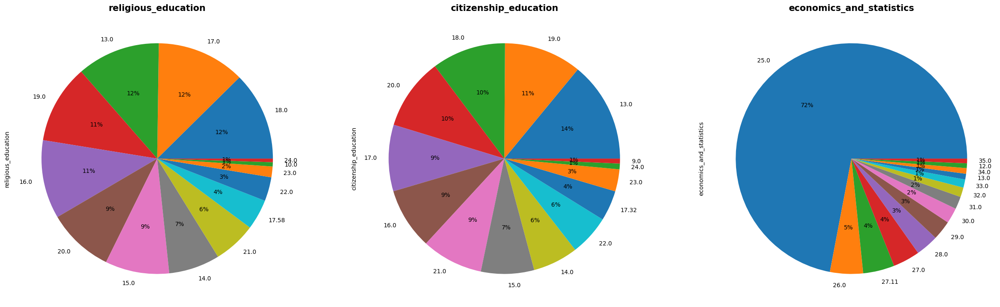

In [305]:
fig, axs = plt.subplots(1, len(Not_intotal_subject.columns), figsize=(30,50))

for i, ax in enumerate(axs.flat):
    Not_intotal_subject.iloc[:,i].value_counts().iloc[:14].plot(kind="pie" , ax=ax, autopct='%1.0f%%')
    ax.set_title(Not_intotal_subject.columns[i], fontsize=15, fontweight='bold')

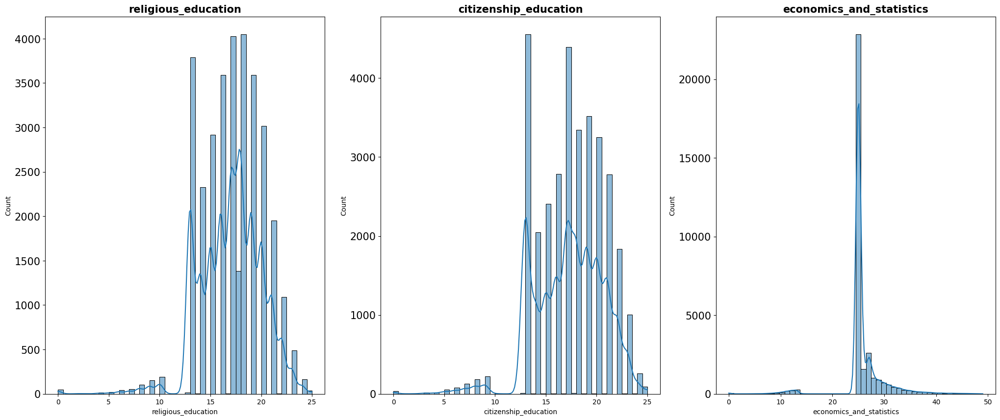

In [306]:
fig,axs=plt.subplots(1,len(Not_intotal_subject.columns),figsize=(25,10))

for i ,ax in enumerate(axs.flat):
    sns.histplot(Not_intotal_subject.iloc[:,i],ax=ax,kde=True,bins=50)
    ax.set_title(Not_intotal_subject.columns[i],fontsize=15,fontweight='bold')
    ax.tick_params(axis='y', labelsize=15)

In [307]:
melted_data = pd.melt(Not_intotal_subject, var_name='Subject', value_name='Score')

# Create a box plot using Plotly Express
fig = px.box(melted_data, x='Subject', y='Score', title='Box Plot for Subject Scores')
fig.update_traces(marker=dict(opacity=0.8))  # Adjust marker properties if needed
fig.update_layout(xaxis=dict(title='Subject'), yaxis=dict(title='Score'))
fig.show()

> - Students Grades in "religion" is the highest where most of the students scored above success grade with low percent of outliers that scored below 10, Seems Like an Easy Subject for Students
> - Like "religion" Most Students's Scores in "altarbiat_alwatania" are also above success grades but with more students scoring less than 15 with fewer outliers, Seems Like an easy Subject for Students but not easier than "religion"

In [308]:
Not_intotal_subject.skew()
Not_intotal_subject.kurt()
pd.DataFrame([Not_intotal_subject.skew(),Not_intotal_subject.kurt()],index=['skew','kurt'])

,religious_education,citizenship_education,economics_and_statistics
skew,-0.545049,-0.549130,-0.462321
kurt,1.800837,0.997178,11.364429


> - The skewness values for all three subjects are negative, indicating that the distributions are skewed to the left. This means that there are more students with lower scores than there are students with higher scores. The skewness value for religious education is the most negative, suggesting that the distribution of religious education scores is the most skewed to the left. This aligns with the observation from the box plot that there is greater variability in religious education scores.
> - The kurtosis values for religious education and economics and statistics are both greater than 3, indicating that the distributions are platykurtic. This means that the distributions have flatter tails than a normal distribution. The kurtosis value for economics and statistics is much greater than 3, suggesting that the distribution of economics and statistics scores is much flatter than a normal distribution. This may be due to outliers in the distribution. The kurtosis value for citizenship education is close to 1, indicating that the distribution of citizenship education scores is close to normal.

<hr>
<hr>
<hr>

<h2 style='color: yellow;text-align: center'>Main Subjects in Literary Specialization</h2>

In [309]:
main_subject=df_literary[['arabic','english','french','school','administration','gender','lot','lat','governorate','student_status']]


In [310]:
main_subject.head()

,arabic,english,french,school,administration,gender,lot,lat,governorate,student_status
0,48.0,25.0,31.0,النور ث للمكفوفين بالجيزة بنين,الدقى,Male,31.211806,29.987075,Giza,successful
1,56.0,41.0,40.0,النور ث للمكفوفين بالجيزة بنين,الدقى,Male,31.211806,29.987075,Giza,successful
2,53.0,25.0,37.0,النور ث للمكفوفين بالجيزة بنين,الدقى,Male,31.211806,29.987075,Giza,successful
3,79.0,37.0,38.0,النور ث للمكفوفين بالجيزة بنين,الدقى,Male,31.211806,29.987075,Giza,successful
4,65.0,36.0,40.0,النور ث للمكفوفين بالجيزة بنين,الدقى,Male,31.211806,29.987075,Giza,successful


In [311]:
main_subject.describe().style.background_gradient()

,arabic,english,french,lot,lat
count,33060.000000,33060.000000,33060.000000,33060.000000,33060.000000
mean,48.382668,29.180097,26.122247,31.031627,29.839279
std,10.306960,7.736865,7.482670,0.409969,0.593478
min,0.000000,0.000000,0.000000,29.895172,22.002892
25%,40.000000,25.000000,20.000000,30.854477,29.340737
50%,47.500000,25.000000,25.000000,31.211806,29.987075
75%,55.500000,34.000000,32.000000,31.211806,29.987075
max,79.000000,49.500000,40.000000,36.673075,31.416743


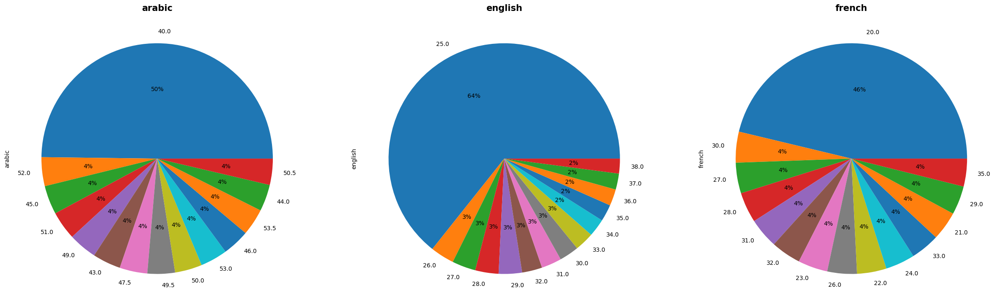

In [312]:
subject=main_subject[['arabic','english','french']]
fig, axs = plt.subplots(1, len(subject.columns), figsize=(30,50))

for i, ax in enumerate(axs.flat):
    subject.iloc[:,i].value_counts().iloc[:14].plot(kind="pie" , ax=ax, autopct='%1.0f%%')
    ax.set_title(main_subject.columns[i], fontsize=15, fontweight='bold')

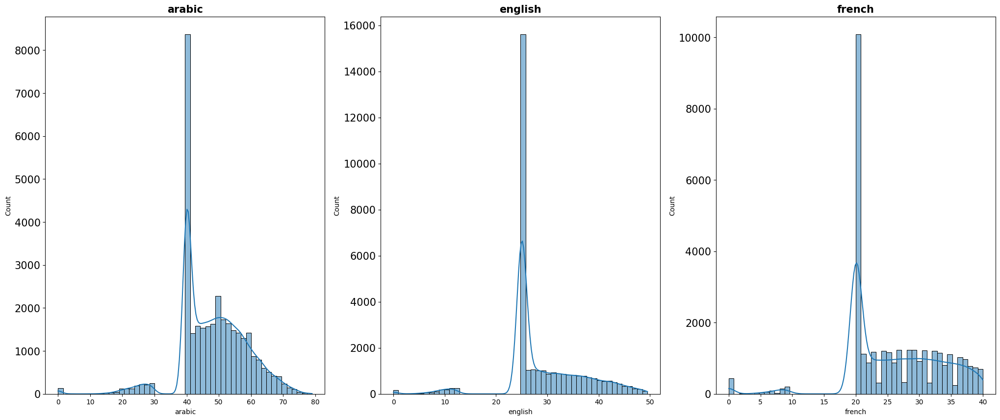

In [313]:
fig,axs=plt.subplots(1,len(subject.select_dtypes('number').columns),figsize=(25,10))

for i ,ax in enumerate(axs.flat):
    sns.histplot(subject.iloc[:,i],ax=ax,kde=True,bins=50)
    ax.set_title(main_subject.columns[i],fontsize=15,fontweight='bold')
    ax.tick_params(axis='y', labelsize=15)

In [314]:
melted_data = pd.melt(main_subject[['arabic','english','french']], var_name='Subject', value_name='Score')

# Create a box plot using Plotly Express
fig = px.box(melted_data, x='Subject', y='Score', title='Box Plot for Subject Scores')
fig.update_traces(marker=dict(opacity=0.8))  # Adjust marker properties if needed
fig.update_layout(xaxis=dict(title='Subject'), yaxis=dict(title='Score'))
fig.show()

> -  The median, represented by the bold blue line within the box, indicates the middle value of the data distribution. In this case, the median scores are 47 for Arabic, 25 for English, and 25 for French.
> - In All Subjects more than 75% of the Student are Scoring Above Success Grade.
> - In "Arabic" the majority of students don't score more than 70, And 75% of the Student's Grades Ranges Only 15 Grades Higher than the Success Grade. Probably the hardest For Students in This Specialization.
> - In english and french 50% of Students Score only 5 Grades Higher than the Succes Grade



In [315]:
Skew_Kurt_DF = pd.DataFrame([main_subject.select_dtypes('number').skew(),main_subject.select_dtypes('number').kurt()] , index=["Skewness","Kurtosis"])
Skew_Kurt_DF

,arabic,english,french,lot,lat
Skewness,-0.371230,0.073448,-0.354460,-0.003780,-0.392089
Kurtosis,1.780205,1.380577,0.792345,8.227009,6.117669


> - Overall, the distribution of scores for Arabic and French exhibits negative skewness, indicating that there are more lower scores than higher scores. The distribution of English scores is approximately symmetrical. The kurtosis values suggest that the distributions are moderately peaked for Arabic and English, while the distribution for French is relatively flat.


Displaying absolute correlations above the threshold (0.3). Specify a positive "threshold" to limit the results further.


<Axes: title={'center': 'Feature-correlation (pearson)'}>

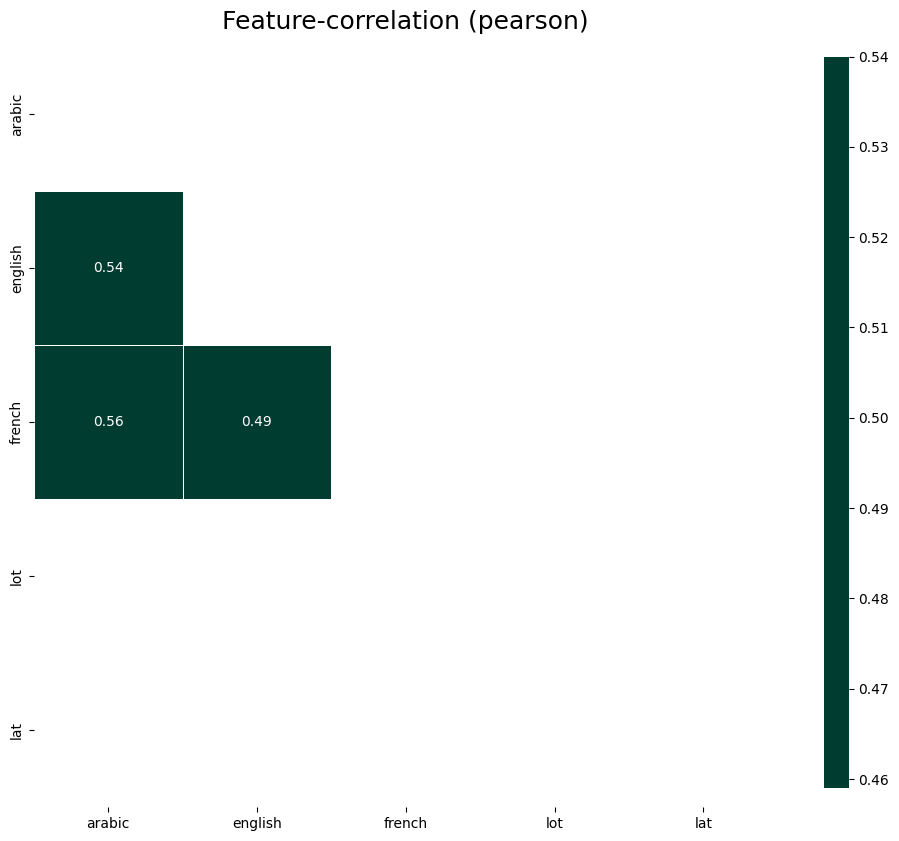

In [316]:
klib.corr_plot(main_subject,split='high')

# distrbution of gender for arabic degree




In [317]:
px.histogram(df_literary,x='arabic',color='gender')

In [318]:
female=df_literary.gender=='Female'
male=df_literary.gender=='Male'
male_data = df_literary[male]['arabic']
female_data = df_literary[female]['arabic']


t_statistic, p_value = stats.ttest_ind(male_data, female_data)

print('p_value',p_value)
print("T-Statistic:", t_statistic)

alpha = 0.05  # Significance level

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.")
else:
    print("Fail to reject the null hypothesis: There may not be a significant difference between genders.")

p_value 5.785782334979427e-10
T-Statistic: -6.198004941755218
Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.


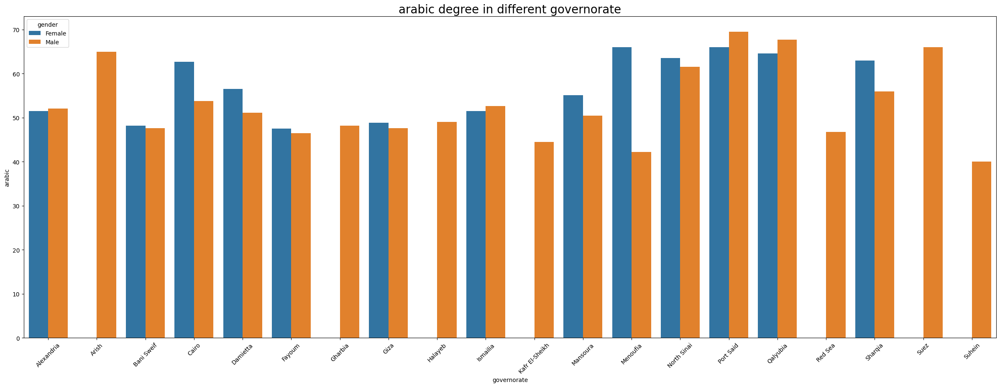

In [319]:
averge_group=df_literary.groupby(['governorate','gender'])['arabic'].mean().reset_index()
plt.figure(figsize=(30,10))
sns.barplot(averge_group,x='governorate',y='arabic',hue='gender')
plt.xticks(rotation=45)
plt.title('arabic degree in different governorate',fontsize=20)
plt.show()

> -  The highest average Arabic degree score appears to be in the governorate of Port Said, followed by Qalyubia and Suze. These three governorates consistently rank among the highest performers in the country, suggesting that there may be factors specific to these regions that contribute to their success in Arabic language education.


# distrbution of gender for english degree

In [320]:
px.histogram(df_literary,x='english',color='gender')

In [321]:
female=df_literary.gender=='Female'
male=df_literary.gender=='Male'
male_data = df_literary[male]['english']
female_data = df_literary[female]['english']


t_statistic, p_value = stats.ttest_ind(male_data, female_data)

print('p_value',p_value)
print("T-Statistic:", t_statistic)

alpha = 0.05  # Significance level

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.")
else:
    print("Fail to reject the null hypothesis: There may not be a significant difference between genders.")

p_value 4.043696223143072e-83
T-Statistic: 19.369428535448307
Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.


In [322]:
df_literary['governorate'].unique()

array(['Giza', 'Fayoum', 'Bani Sweif', 'Cairo', 'Qalyubia', 'Menoufia',
       'North Sinai', 'Red Sea', 'Sharqia', 'Damietta', 'Mansoura',
       'Suez', 'Port Said', 'Arish', 'Ismailia', 'Alexandria', 'Gharbia',
       'Halayeb', 'Suhein', 'Kafr El-Sheikh'], dtype=object)

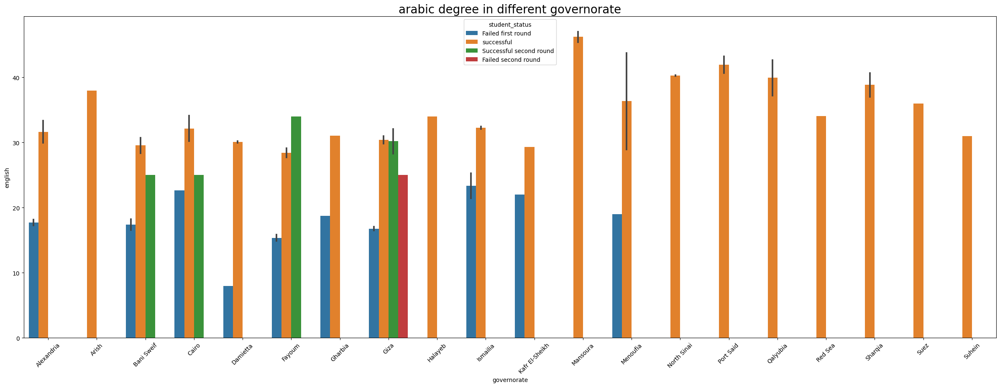

In [323]:
averge_group=df_literary.groupby(['governorate','gender','student_status'])['english'].mean().reset_index()
plt.figure(figsize=(30,10))
sns.barplot(averge_group,x='governorate',y='english',hue='student_status')
plt.xticks(rotation=45)
plt.title('arabic degree in different governorate',fontsize=20)
plt.show()

> - the highest governorate in successful status is  Mansoura
> - in giza the averge successful is more than 30


# distrbution of gender for french degree

In [324]:
px.histogram(df_literary,x='french',color='gender')

In [325]:
female=df_literary.gender=='Female'
male=df_literary.gender=='Male'
male_data = df_literary[male]['french']
female_data = df_literary[female]['french']


t_statistic, p_value = stats.ttest_ind(male_data, female_data)

print('p_value',p_value)
print("T-Statistic:", t_statistic)

alpha = 0.05  # Significance level

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.")
else:
    print("Fail to reject the null hypothesis: There may not be a significant difference between genders.")

p_value 3.083479515538475e-32
T-Statistic: -11.832407783641083
Reject the null hypothesis: There is a significant difference between genders in the linguistic variable.


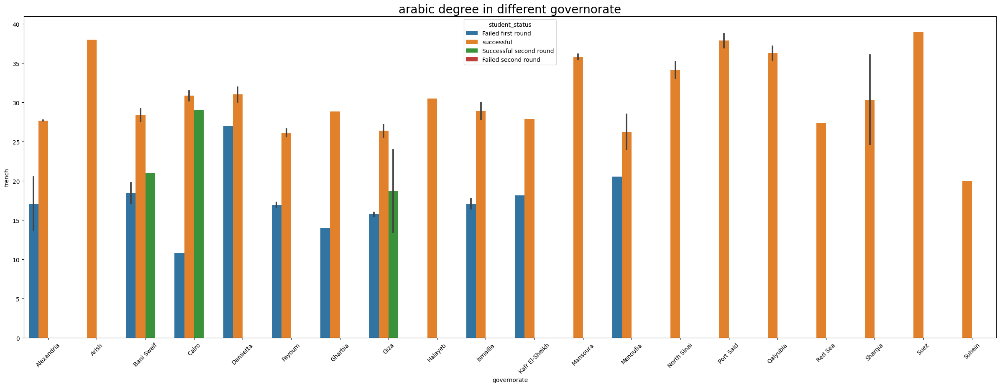

In [326]:
averge_group=df_literary.groupby(['governorate','gender','student_status'])['french'].mean().reset_index()
plt.figure(figsize=(30,10))
sns.barplot(averge_group,x='governorate',y='french',hue='student_status')
plt.xticks(rotation=45)
plt.title('arabic degree in different governorate',fontsize=20)
plt.show()

> - from the visulation we see that no student fail in the second exam
> - cairo is the highest governorate in the successful in second exam   

## last thing scatter_mapbox of the _subject visulation

In [327]:
pip install dash

In [328]:
from dash import Dash, html, dcc, Input, Output
import plotly.express as px
import pandas as pd



# Exclude 'lat' and 'lot' columns from the numeric columns list
numeric_columns = [col for col in main_subject.select_dtypes(include='number').columns if col not in ['lat', 'lot']]
unique_genders = main_subject['gender'].unique()
unique_genders = ['All Genders'] + list(unique_genders)

app = Dash()

app.layout = html.Div(children=[
    html.H4('Scatter Mapbox Plot - Select Subject'),
    html.Div([
        dcc.Dropdown(
            id='subjects',
            options=[{'label': col, 'value': col} for col in numeric_columns],
            value=numeric_columns[0]
        )
    ], style={'width': '50%', 'margin': 'auto'}),
    dcc.Graph(id='scatter_mapbox')
])

@app.callback(
    Output('scatter_mapbox', 'figure'),
    [Input('subjects', 'value')]
)
def update_plot(select_subject):
    fig = px.scatter_mapbox(main_subject,
                            lat='lat',
                            lon='lot',
                            color=main_subject[select_subject],
                            size=main_subject[select_subject],
                            size_max=15,
                            zoom=10,
                            mapbox_style='carto-positron',
                            color_continuous_scale=px.colors.cyclical.IceFire,
                            hover_name='governorate')
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

<hr>
<hr>
<hr>

# Specialization Subjects in Literary Specialization


In [329]:
literary_Subjects = df_literary[['history', 'geography',
       'philosophy', 'psychology_and_sociology', 'total_score', 'governorate', 'lat', 'lot',
       'gender','administration','student_status']]
literary_Subjects.head()

,history,geography,philosophy,psychology_and_sociology,total_score,governorate,lat,lot,gender,administration,student_status
0,30.0,30.0,30.0,30.0,224.0,Giza,29.987075,31.211806,Male,الدقى,successful
1,31.0,41.0,36.0,39.0,284.0,Giza,29.987075,31.211806,Male,الدقى,successful
2,30.0,30.0,30.0,31.0,236.0,Giza,29.987075,31.211806,Male,الدقى,successful
3,46.0,58.0,57.0,44.0,359.0,Giza,29.987075,31.211806,Male,الدقى,successful
4,30.0,37.0,40.0,38.0,286.0,Giza,29.987075,31.211806,Male,الدقى,successful


In [330]:
# numerical descrption
spec_subject=literary_Subjects[['history', 'geography',
       'philosophy', 'psychology_and_sociology']]
spec_subject.describe().style.background_gradient()

,history,geography,philosophy,psychology_and_sociology
count,33060.000000,33060.000000,33060.000000,33060.000000
mean,35.568088,40.911963,38.897247,39.030792
std,8.313002,10.286589,8.923108,8.153158
min,0.000000,0.000000,0.000000,0.000000
25%,30.000000,31.000000,32.000000,33.000000
50%,33.500000,42.000000,39.000000,39.500000
75%,41.000000,49.500000,45.500000,45.000000
max,60.000000,60.000000,60.000000,60.000000


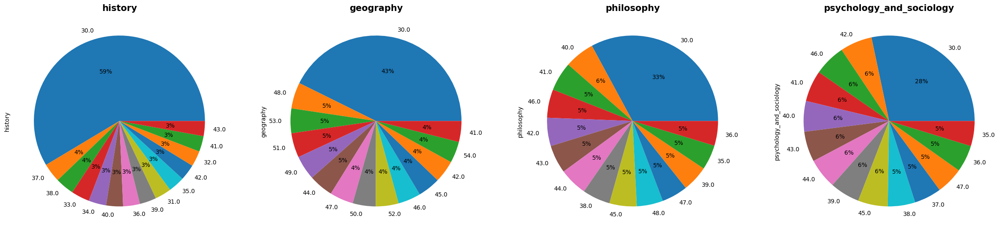

In [331]:
fig, axs = plt.subplots(1, len(spec_subject.columns), figsize=(30,50))

for i, ax in enumerate(axs.flat):
    spec_subject.iloc[:,i].value_counts().iloc[:14].plot(kind="pie" , ax=ax, autopct='%1.0f%%')
    ax.set_title(spec_subject.columns[i], fontsize=15, fontweight='bold')

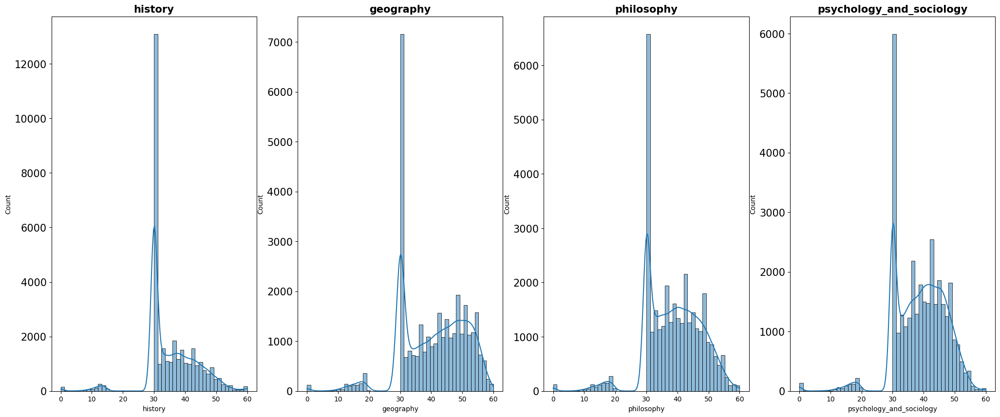

In [334]:
fig,axs=plt.subplots(1,len(spec_subject.columns),figsize=(25,10))

for i ,ax in enumerate(axs.flat):
    sns.histplot(spec_subject.iloc[:,i],ax=ax,kde=True,bins=50)
    ax.set_title(spec_subject.columns[i],fontsize=15,fontweight='bold')
    ax.tick_params(axis='y', labelsize=15)

In [335]:
melted_data = pd.melt(spec_subject, var_name='Subject', value_name='Score')

# Create a box plot using Plotly Express
fig = px.box(melted_data, x='Subject', y='Score', title='Box Plot for Subject Scores')
fig.update_traces(marker=dict(opacity=0.8))  # Adjust marker properties if needed
fig.update_layout(xaxis=dict(title='Subject'), yaxis=dict(title='Score'))
fig.show()




*   the max score of the subjects is 60
*   The success rate in specialization subjects exceeds 90 and the failure rate in the first attempt does not exceed 10%.
*   Distributions of Student Grades Seems to be the Same in **philosophy and psychology**.









In [336]:
px.histogram(df_literary,x='english',color='gender')

In [337]:
literary_Subjects.columns

Index(['history', 'geography', 'philosophy', 'psychology_and_sociology',
       'total_score', 'governorate', 'lat', 'lot', 'gender', 'administration',
       'student_status'],
      dtype='object')

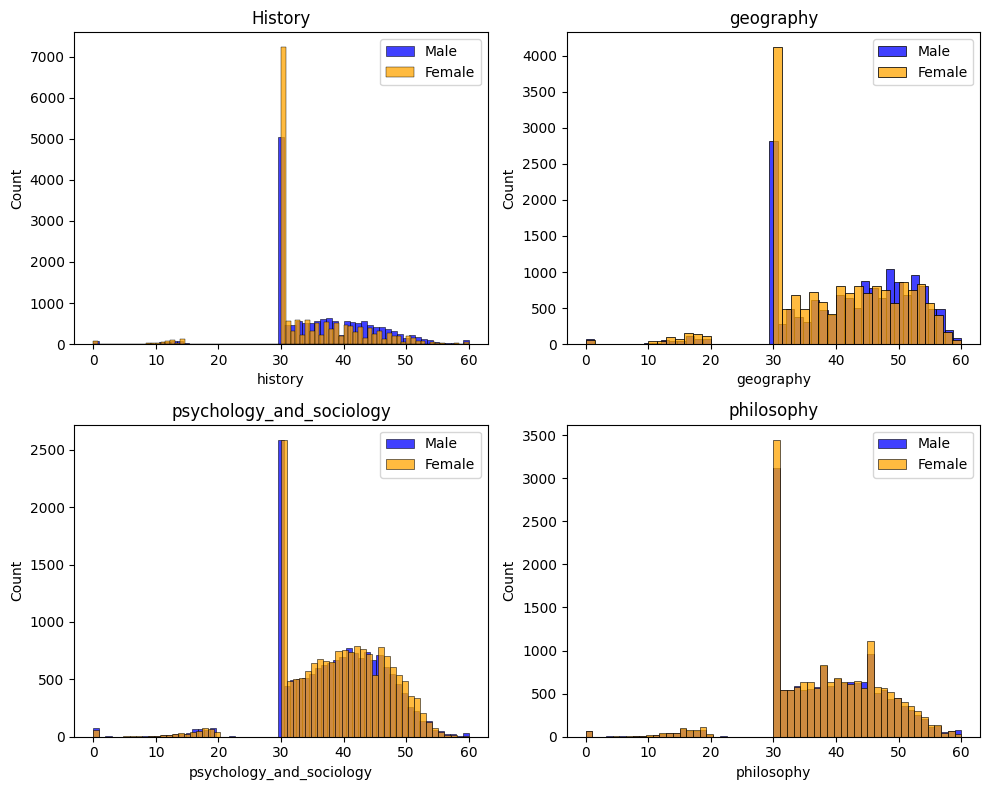

In [338]:

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Creating a 2x2 subplot grid

sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Male']['history'], ax=axes[0, 0], color='blue', label='Male')
sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Female']['history'], ax=axes[0, 0], color='orange', label='Female')
axes[0, 0].legend()
axes[0, 0].set_title('History')

sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Male']['geography'], ax=axes[0, 1], color='blue', label='Male')
sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Female']['geography'], ax=axes[0, 1], color='orange', label='Female')
axes[0, 1].legend()
axes[0, 1].set_title('geography')

sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Male']['psychology_and_sociology'], ax=axes[1, 0], color='blue', label='Male')
sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Female']['psychology_and_sociology'], ax=axes[1, 0], color='orange', label='Female')
axes[1, 0].legend()
axes[1, 0].set_title('psychology_and_sociology')

sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Male']['philosophy'], ax=axes[1, 1], color='blue', label='Male')
sns.histplot(literary_Subjects[literary_Subjects['gender'] == 'Female']['philosophy'], ax=axes[1, 1], color='orange', label='Female')
axes[1, 1].legend()
axes[1, 1].set_title('philosophy')

plt.tight_layout()
plt.show()


 # scatter_mapbox for the literary_subjects

In [339]:
from dash import Dash, html, dcc, Input, Output
import plotly.express as px
import pandas as pd




numeric_columns = [col for col in literary_Subjects.select_dtypes(include='number').columns if col not in ['lat', 'lot','total_score']]


app = Dash()

app.layout = html.Div(children=[
    html.H4('Scatter Mapbox Plot - Select Subject'),
    html.Div([
        dcc.Dropdown(
            id='subjects',
            options=[{'label': col, 'value': col} for col in numeric_columns],
            value=numeric_columns[0]
        )
    ], style={'width': '50%', 'margin': 'auto'}),
    dcc.Graph(id='scatter_mapbox')
])

@app.callback(
    Output('scatter_mapbox', 'figure'),
    [Input('subjects', 'value')]
)
def update_plot(select_subject):
    fig = px.scatter_mapbox(literary_Subjects,
                            lat='lat',
                            lon='lot',
                            color=literary_Subjects[select_subject],
                            size=literary_Subjects[select_subject],
                            size_max=15,
                            zoom=10,
                            mapbox_style='carto-positron',
                            color_continuous_scale=px.colors.cyclical.IceFire,
                            hover_name='governorate')
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

# some analysis for literary_Subjects

## first corr between the subjecs and total score

<Axes: title={'center': 'Feature-correlation (pearson)'}>

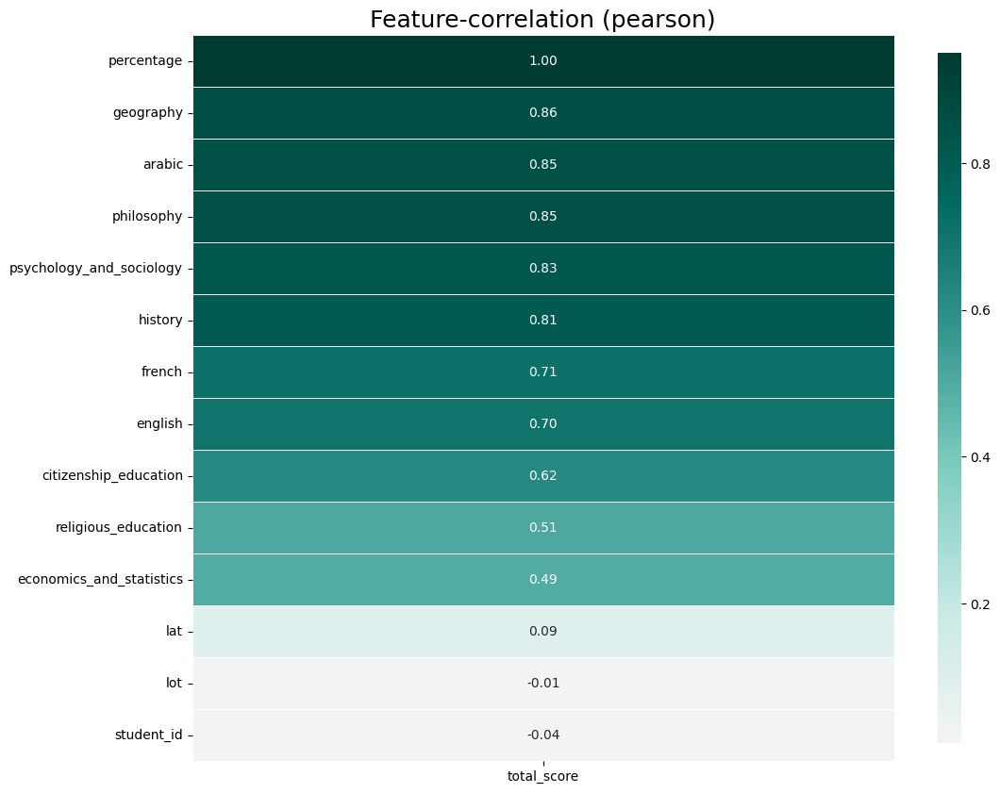

In [342]:
klib.corr_plot(df_literary,target='total_score')

> - Through the index, it is possible to know the subjects that have the most influence on the overall total. Geography comes in first place, followed by Arabic and physiology.

In [343]:
subjects = ['arabic', 'english', 'french',  'history', 'geography', 'philosophy', 'psychology_and_sociology']


# Group data by schools and divisions and calculate average scores for each subject
average_scores_by_school = df_literary.groupby('school')[subjects].mean()
average_scores_by_governorate = df_literary.groupby('governorate')[subjects].mean()

# Calculate the change in average scores (you can calculate the difference or percentage change)
change_school = average_scores_by_school.diff()
change_governorate = average_scores_by_governorate.diff()
change_school_df = pd.DataFrame(change_school, columns=subjects)
change_governorate_df = pd.DataFrame(change_governorate, columns=subjects)

# Display the change in average scores for schools and divisions
print("Change in Average Scores by School:")
change_school_df

Change in Average Scores by School:


,arabic,english,french,history,geography,philosophy,psychology_and_sociology
school,,,,,,,
( الشهيد مهنى محمد مهنى مؤمن) سابقاً طبهار ث م بنات,NaN,NaN,NaN,NaN,NaN,NaN,NaN
( الشهيد مهنى محمد مهنى مؤمن) سابقاً طبهار ث م بنين,5.483333,0.558333,0.741667,1.862500,3.500000,2.229167,2.979167
6 اكتوبر الحى السادس ث بنين,0.609107,3.553694,-2.661942,1.586985,1.713058,0.191796,-0.132088
6 اكتوبر الرسمية لغات بنات,4.640893,0.321306,5.786942,18.850515,8.786942,3.745704,-0.180412
6 اكتوبر ث اوراسكوم بنات,-6.268519,-1.583333,-4.990741,-21.250000,-13.046296,-3.629630,0.120370
...,...,...,...,...,...,...,...
ويزنس للغات بنات,20.728070,26.020468,16.201754,15.643275,18.605263,20.412281,19.301170
ويزنس للغات بنين,-8.019737,-10.756579,-7.180921,-7.108553,-13.230263,-6.578947,-10.266447
يوسف السباعى ث بنين,1.173828,-3.863281,-1.392578,4.294922,9.923828,0.808594,6.347656


In [344]:
stand = 1  # Define your threshold for improvement or decline

# Check for consistent improvement or decline across schools for each subject
for subject in change_school_df.columns:
    improvement = change_school_df[change_school_df[subject] > stand].index.tolist()
    decline = change_school_df[change_school_df[subject] < -stand].index.tolist()

    print(f"\nSubject: {subject}")
    print(f"Schools with consistent improvement in {subject}: {improvement}")
    print(f"Schools with consistent decline in {subject}: {decline}")



Subject: arabic
Schools with consistent improvement in arabic: ['( الشهيد مهنى محمد مهنى مؤمن) سابقاً طبهار ث م بنين', '6 اكتوبر الرسمية لغات بنات', '6اكتوبر الاعداديه الثانويه بنات ح 7', 'ابشنا الثانوية بنين', 'ابشواى الثانوية م بنات', 'ابشواى الثانوية م بنين', 'ابن سينا الخاصه لغات بنات', 'ابن سينا ث خ عربى بنات', 'ابناء الاندلس (1) عربى ث خ م بنات', 'ابناء الاندلس الخاصه (1) لغات ث م بنين', 'ابو الهول خ لغات بنات', 'ابو الهول خ لغات بنين', 'ابو عبيده بن الجراح ث بنات', 'ابو كساه ث م بنات', 'ابوبكر الصديق ث م بنات', 'ابوبكر الصديق ث م بنين', 'احمد مفتاح معبد التجريبية بنين', 'احمس ث خ بنات', 'احمس ث خ لغات بنات', 'اسماعيل عبد اللطيف اباظه ث بنين', 'اكتوبر خ لغات بنات', 'ال عثمان الخاصه ث عربى بنين', 'الأنبا إبرام خ لغات بنين', 'الأنوار الخاصة لغات ث م بنين', 'الابراهيمية الخاصة الثانوية', 'الاسلامية الثانوية (نفيسة الحصرى) ث خ م بنين', 'الاندلس ث م بنين بقاى', 'الاهرامات 1 ث خ بنات', 'الاهرامات خ لغات بنات', 'الاورمان الحديثه ث لغات بنين', 'الاورمان ث بنات', 'الاورمان ث خ بناهيا بني

In [345]:
stand = 1


for subject in change_governorate_df.columns:
    improvement = change_governorate_df[change_governorate_df[subject] > stand].index.tolist()
    decline = change_governorate_df[change_governorate_df[subject] < -stand].index.tolist()

    print(f"\nSubject: {subject}")
    print(f"Schools with consistent improvement in {subject}: {improvement}")
    print(f"Schools with consistent decline in {subject}: {decline}")



Subject: arabic
Schools with consistent improvement in arabic: ['Arish', 'Cairo', 'Gharbia', 'Ismailia', 'Mansoura', 'North Sinai', 'Port Said', 'Sharqia', 'Suez']
Schools with consistent decline in arabic: ['Bani Sweif', 'Damietta', 'Fayoum', 'Kafr El-Sheikh', 'Menoufia', 'Qalyubia', 'Red Sea', 'Suhein']

Subject: english
Schools with consistent improvement in english: ['Arish', 'Cairo', 'Gharbia', 'Halayeb', 'Mansoura', 'North Sinai', 'Port Said', 'Sharqia']
Schools with consistent decline in english: ['Bani Sweif', 'Damietta', 'Fayoum', 'Giza', 'Ismailia', 'Kafr El-Sheikh', 'Menoufia', 'Qalyubia', 'Red Sea', 'Suez', 'Suhein']

Subject: french
Schools with consistent improvement in french: ['Arish', 'Cairo', 'Gharbia', 'Halayeb', 'Mansoura', 'North Sinai', 'Port Said', 'Sharqia', 'Suez']
Schools with consistent decline in french: ['Bani Sweif', 'Fayoum', 'Giza', 'Ismailia', 'Kafr El-Sheikh', 'Menoufia', 'Qalyubia', 'Red Sea', 'Suhein']

Subject: history
Schools with consistent impro